In [ ]:
import torch
from torch import nn
import albumentations as A
import torchvision
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from skimage import color
import numpy as np
import os, time, pickle, json 
from glob import glob 
from PIL import Image
import cv2 
from typing import List, Tuple, Dict
from statistics import mean 
import torch.nn.functional as F
import torch 
import torch.nn as nn 
from torch.utils.data import DataLoader
import pickle

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
class VGGPerceptualLoss(torch.nn.Module):
    def __init__(self, resize=True):
        super(VGGPerceptualLoss, self).__init__()
        blocks = []
        blocks.append(torchvision.models.vgg16(pretrained=True).features[:4].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[4:9].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[9:16].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[16:23].eval())
        for bl in blocks:
            for p in bl.parameters():
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks)
        self.transform = torch.nn.functional.interpolate
        self.resize = resize
        self.register_buffer("mean", torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer("std", torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))

    def forward(self, input, target, feature_layers=[0, 1, 2, 3], style_layers=[]):
        if input.shape[1] != 3:
            input = input.repeat(1, 3, 1, 1)
            target = target.repeat(1, 3, 1, 1)
        input = (input-self.mean) / self.std
        target = (target-self.mean) / self.std
        if self.resize:
            input = self.transform(input, mode='bilinear', size=(224, 224), align_corners=False)
            target = self.transform(target, mode='bilinear', size=(224, 224), align_corners=False)
        loss = 0.0
        x = input
        y = target
        for i, block in enumerate(self.blocks):
            x = block(x)
            y = block(y)
            if i in feature_layers:
                loss += torch.nn.functional.l1_loss(x, y)
            if i in style_layers:
                act_x = x.reshape(x.shape[0], x.shape[1], -1)
                act_y = y.reshape(y.shape[0], y.shape[1], -1)
                gram_x = act_x @ act_x.permute(0, 2, 1)
                gram_y = act_y @ act_y.permute(0, 2, 1)
                loss += torch.nn.functional.l1_loss(gram_x, gram_y)
        return loss

In [ ]:
perceptual_loss = VGGPerceptualLoss().to(device)

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(3, 256, 256)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    fig, ax = plt.subplots(figsize = (15, 5))
    im = ax.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels (assumes that the input's size and the new size are
    even numbers).
    Parameters:
        image: image tensor of shape (batch size, channels, height, width)
        new_shape: a torch.Size object with the shape you want x to have
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs an upsampling, a convolution, a concatenation of its two inputs,
    followed by two more convolutions with optional dropout
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=2, padding=1)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x, skip_con_x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv3(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        return x

class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a U-Net - 
    maps each pixel to a pixel with the correct number of output dimensions
    using a 1x1 convolution.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock: 
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x

class UNet(nn.Module):
    '''
    U-Net
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=32):
        super(UNet, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels * 2, use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels * 4, use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.contract5 = ContractingBlock(hidden_channels * 16)
        self.contract6 = ContractingBlock(hidden_channels * 32)
        self.expand0 = ExpandingBlock(hidden_channels * 64)
        self.expand1 = ExpandingBlock(hidden_channels * 32)
        self.expand2 = ExpandingBlock(hidden_channels * 16)
        self.expand3 = ExpandingBlock(hidden_channels * 8)
        self.expand4 = ExpandingBlock(hidden_channels * 4)
        self.expand5 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        '''
        Function for completing a forward pass of UNet: 
        Given an image tensor, passes it through U-Net and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        x7 = self.expand0(x6, x5)
        x8 = self.expand1(x7, x4)
        x9 = self.expand2(x8, x3)
        x10 = self.expand3(x9, x2)
        x11 = self.expand4(x10, x1)
        x12 = self.expand5(x11, x0)
        xn = self.downfeature(x12)
        return self.sigmoid(xn)

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator 
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [ ]:
dataset = []
with open(r"/content/drive/MyDrive/ai4good/okdataset.pkl", "rb") as file:
  dataset = pickle.load(file)

In [ ]:
dataset2 = []
with open(r"/content/drive/MyDrive/ai4good/okdataset2.pkl", "rb") as file:
  dataset2 = pickle.load(file)

In [ ]:
dataset = dataset + dataset2

In [ ]:
#plt.imshow(dataset[888][0])

In [ ]:
#plt.imshow(np.squeeze(dataset[888][1]))

In [ ]:
#Change to euler folder
#imgs_ = 'enter_mask_patch_paths'
#masks_ = 'enter_mask_patch_paths'

#imgs_ = '/content/drive/MyDrive/ai4good/Khartoum/image_patches'
#masks_ = '/content/drive/MyDrive/ai4good/Khartoum/mask_patches'

#img_paths = sorted(glob(imgs_ + "/*.png"))
#mask_paths = sorted(glob(masks_ + "/*.png"))

#Sanity Checks


In [ ]:
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
#this parameter tunes the pixel to pixel loss's weight
#see crit loss above to understand
lambda_recon = 10

n_epochs = 10
input_dim = 3
out_dim = 1
display_step = 500
batch_size = 8
lr = 0.00001
target_shape = 256

MEAN = (0.5, 0.5, 0.5,)
STD = (0.5, 0.5, 0.5,)
SIZE = 256



class Transform():
    def __init__(self, mean=MEAN, std=STD):
        self.data_transform = transforms.Compose([ 
            transforms.ToTensor(),
            transforms.Normalize(mean, std)
        ])
        
    def __call__(self, img: Image.Image):
        return self.data_transform(img)

class Mask_Transform():
    def __init__(self):
        self.data_transform = transforms.Compose([ 
            transforms.ToTensor(),
        ])
        
    def __call__(self, img: Image.Image):
        return self.data_transform(img)

    
class Dataset(object):
    def __init__(self, data, aug):
        self.data = data 
        self.transformer = Transform()
        self.mask_transform = Mask_Transform()
        self.aug = aug
        
    
    def __getitem__(self, idx: int):
        image, mask = self.data[idx]
        t = self.aug(image = image, mask = mask)
        image = t['image']
        mask = t['mask']
        image = self.transformer(image)
        mask = self.mask_transform(mask)
        return image, mask
    
    def __len__(self):
        return len(self.data)

In [ ]:
train_transforms = A.Compose([# D4 Group augmentations
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightness(limit = 0.1, p = 0.5),                 
                #A.Normalize(mean = MEAN, std = STD)
                ])

In [ ]:
#use this to load images per batch slow and sometimes runs a pytorch error
#still investigating
#data_read = list(zip(img_paths, mask_paths))
#train_read = Dataset_read(data_read)
train_ds = Dataset(dataset, aug = train_transforms)

In [ ]:
#len(train_read)

In [ ]:
len(train_ds)

29380

In [ ]:
#uncomment if not loading old model
gen = UNet(3, 1).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
#disc = Discriminator(input_dim + out_dim).to(device)
#disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
#uncomment only if start new training
#gen = gen.apply(weights_init)
#disc = disc.apply(weights_init)


In [ ]:
#spacenet weights
#gen.load_state_dict(torch.load('/content/drive/MyDrive/ai4good/pix2pixgenvsafety199.pth'))
#disc.load_state_dict(torch.load('/content/drive/MyDrive/ai4good/pix2pixdiscsafety199.pth'))
#our weights ploss
gen.load_state_dict(torch.load('/content/drive/MyDrive/ai4good/pix2pixperceptual.pth'))

<All keys matched successfully>

In [ ]:
lambda_recon = 100

In [ ]:
def get_gen_loss(gen, mask, image, adv_criterion, recon_criterion, lambda_recon):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator; takes the condition and returns potential images
        disc: the discriminator; takes images and the condition and
          returns mask/fake prediction matrices
        mask: the mask images (e.g. maps) to be used to evaluate the reconstruction
        image: the satellite images) which are used to produce the masks
        adv_criterion: the adversarial loss function; takes the discriminator 
        predictions and the true labels and returns a adversarial loss 
        recon_criterion: the reconstruction loss function; takes the generator 
        outputs and the masks and returns a reconstruction loss 
        lambda_recon: the degree to which the reconstruction loss should be weighted in the sum
        #found higher to be better pix2pix used 200
    '''
    fake = gen(image)
    #disc_fake_hat = disc(fake, image)
    #gen_adv_loss = adv_criterion(disc_fake_hat.detach(), torch.ones_like(disc_fake_hat))
    p_loss = perceptual_loss(fake, mask)
    gen_rec_loss = recon_criterion(mask, fake)
    gen_loss = p_loss + lambda_recon * gen_rec_loss
    return gen_loss, p_loss

In [ ]:
batch_size = 16

In [ ]:
def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    #depending on data loading preference uncomment/comment
    #dataloader = DataLoader(train_read, batch_size=4, shuffle=True)
    dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        #if epoch % 10 == 0 and epoch > 1:
        #    torch.save(gen.state_dict(), f'/content/drive/MyDrive/ai4good/pix2pixgenv2x{epoch}.pth')
        #    torch.save(disc.state_dict(), f'/content/drive/MyDrive/ai4good/pix2pixdiscv2x{epoch}.pth')

        for image, mask in tqdm(dataloader):
            cur_batch_size = len(mask)
            
            mask = mask.to(device)
            image = image.to(device)
            ### Update discriminator ###
            #disc_opt.zero_grad() 
            with torch.no_grad():
                fake_map = gen(image)
            #disc_fake_hat = disc(fake_map.detach(), image) 
            #disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            #disc_real_hat = disc(mask, image)
            #disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            #disc_loss = (disc_fake_loss + disc_real_loss) / 2
            #disc_loss.backward(retain_graph=False) 
            #disc_opt.step()

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss, p_loss = get_gen_loss(gen, mask, image, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() 
            gen_opt.step() 

            # Keep track of the average discriminator loss
            #mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, p_loss: {p_loss}")
                show_tensor_images(image, size=(input_dim, target_shape, target_shape))
                show_tensor_images(mask, size=(out_dim, target_shape, target_shape))
                show_tensor_images(fake_map, size=(out_dim, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
            cur_step += 1

  0%|          | 0/1837 [00:00<?, ?it/s]

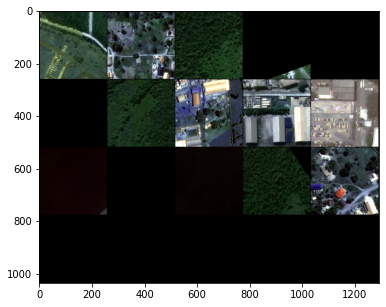

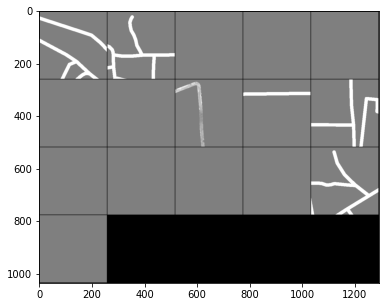

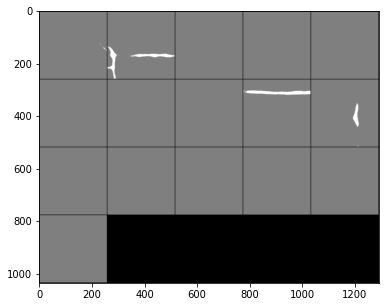

Epoch 0: Step 500: Generator (U-Net) loss: 8.443394660472867, p_loss: 0.9195359349250793


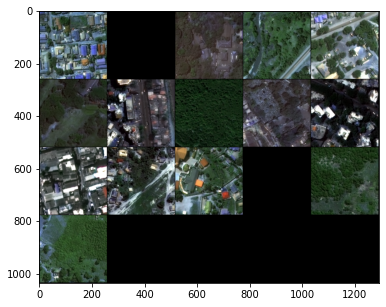

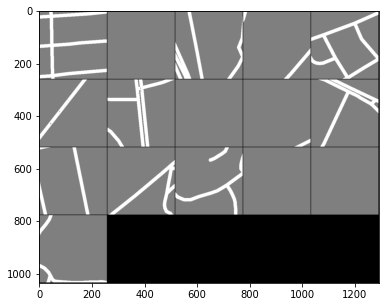

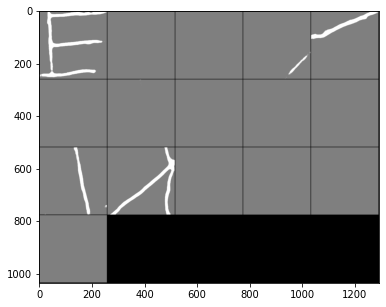

Epoch 0: Step 1000: Generator (U-Net) loss: 8.261648169994354, p_loss: 0.9544470310211182


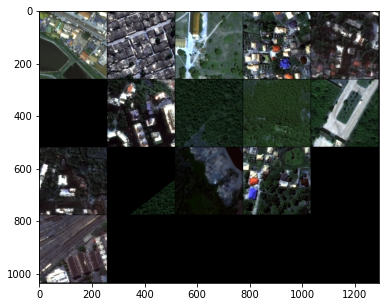

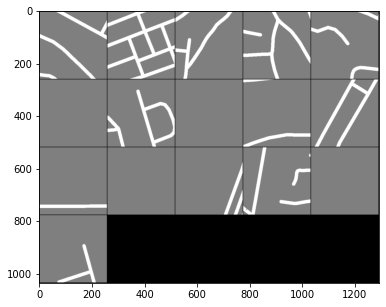

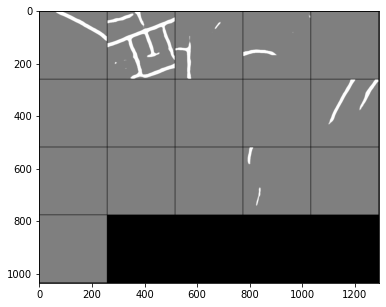

Epoch 0: Step 1500: Generator (U-Net) loss: 8.356007780551908, p_loss: 1.279994010925293


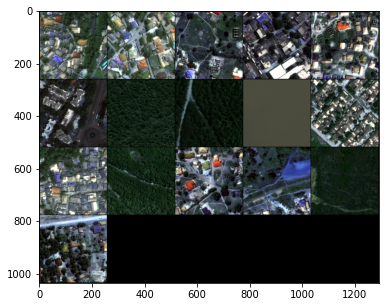

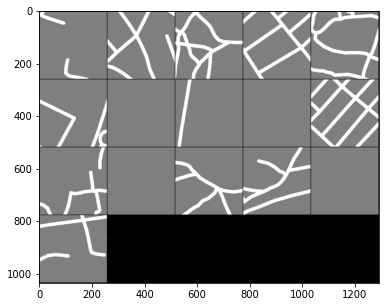

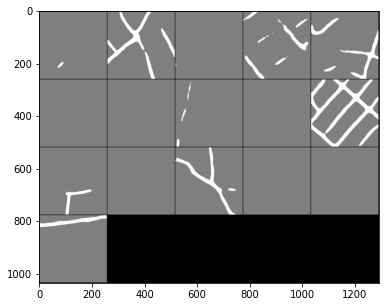

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 1: Step 2000: Generator (U-Net) loss: 8.211786565303807, p_loss: 1.1718631982803345


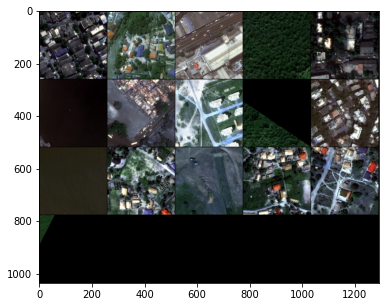

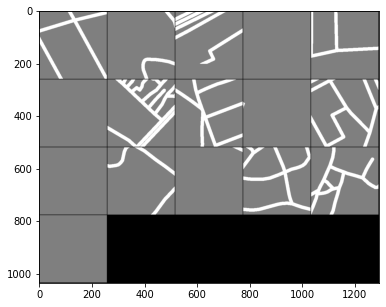

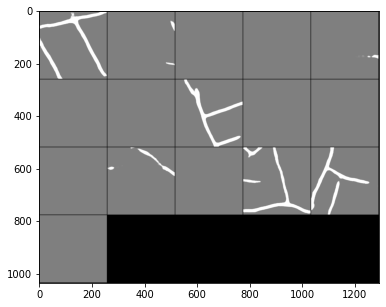

Epoch 1: Step 2500: Generator (U-Net) loss: 8.280365861415873, p_loss: 1.2529206275939941


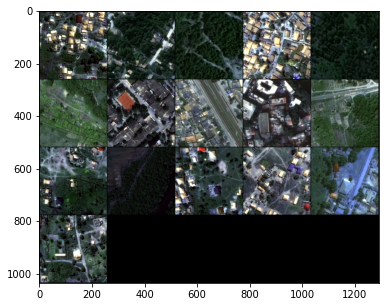

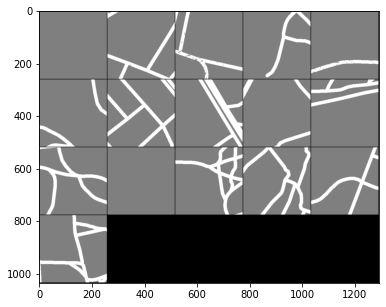

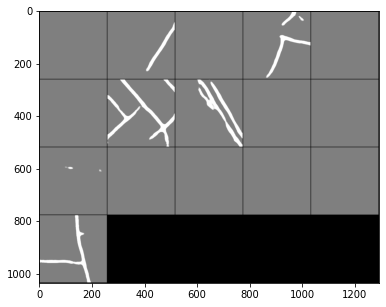

Epoch 1: Step 3000: Generator (U-Net) loss: 8.255730181217197, p_loss: 1.3265620470046997


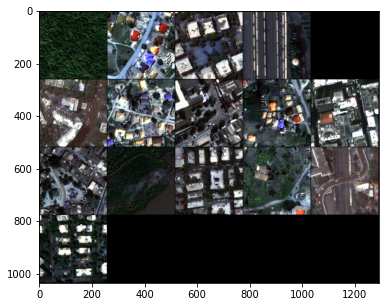

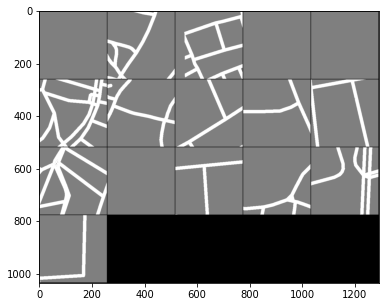

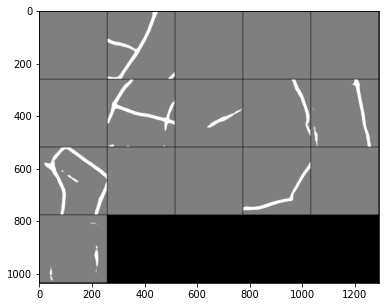

Epoch 1: Step 3500: Generator (U-Net) loss: 8.312423018455496, p_loss: 1.1292885541915894


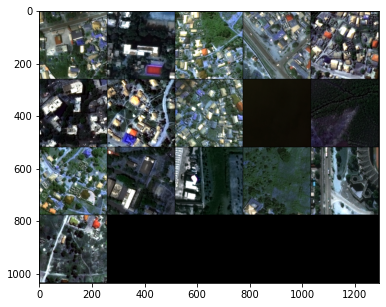

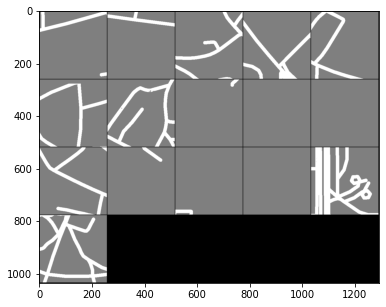

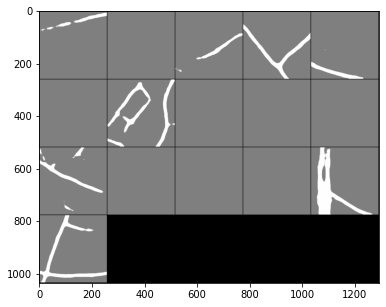

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 2: Step 4000: Generator (U-Net) loss: 8.25570561552048, p_loss: 1.1019418239593506


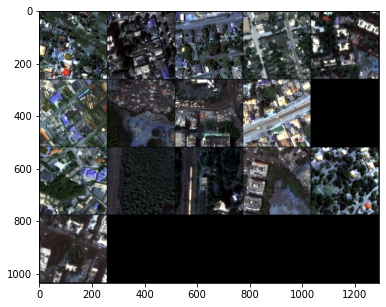

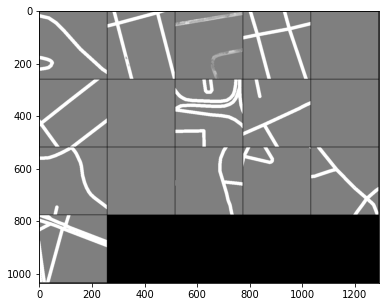

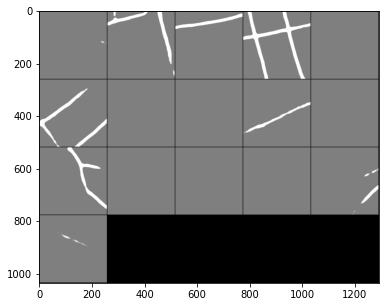

Epoch 2: Step 4500: Generator (U-Net) loss: 8.083723133564002, p_loss: 1.2079724073410034


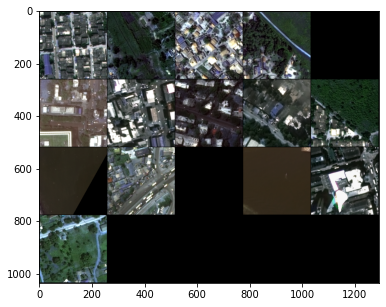

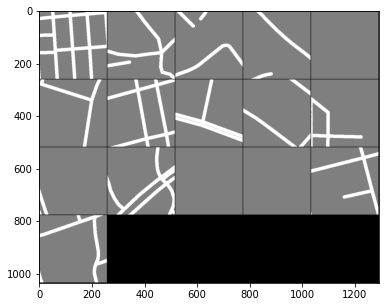

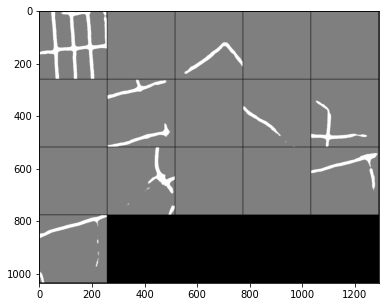

Epoch 2: Step 5000: Generator (U-Net) loss: 8.311106678009033, p_loss: 1.0382713079452515


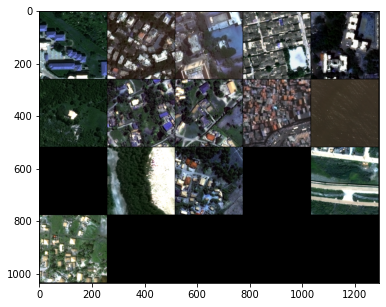

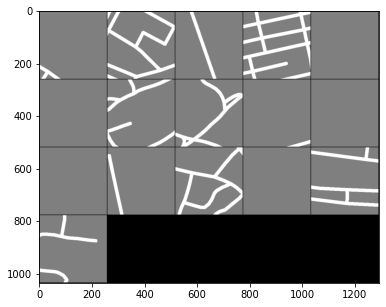

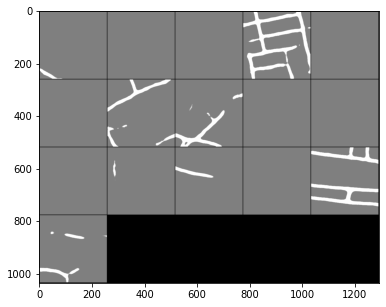

Epoch 2: Step 5500: Generator (U-Net) loss: 8.322742257118227, p_loss: 0.9772202372550964


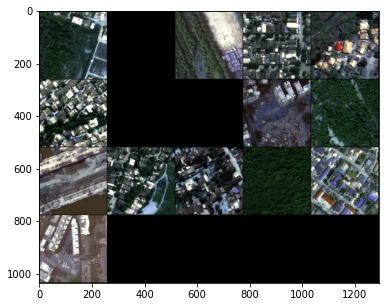

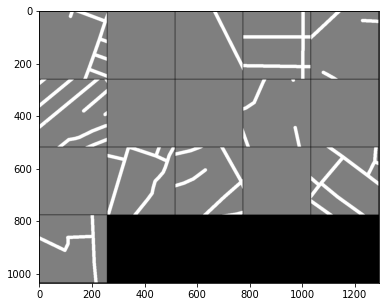

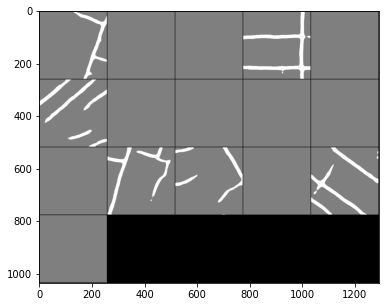

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 3: Step 6000: Generator (U-Net) loss: 8.16422924757004, p_loss: 0.6541570425033569


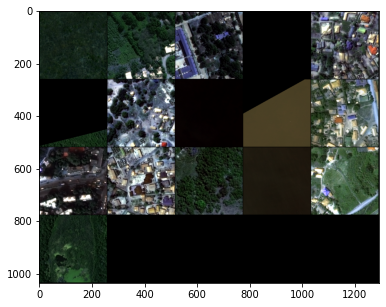

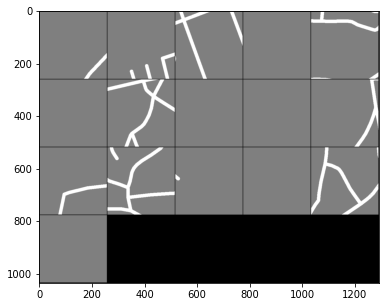

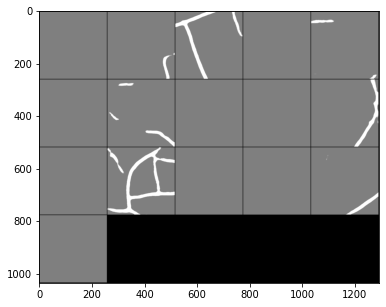

Epoch 3: Step 6500: Generator (U-Net) loss: 8.389505561828608, p_loss: 1.3613930940628052


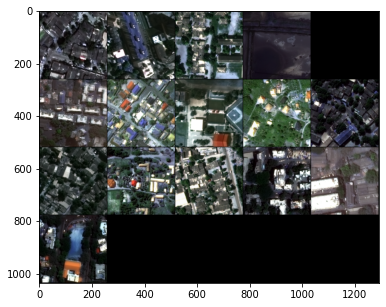

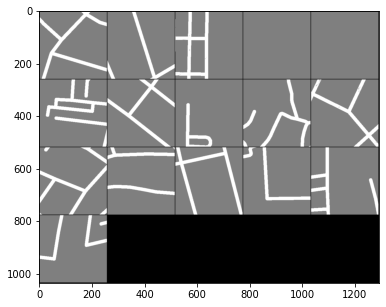

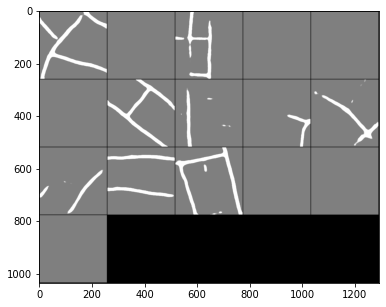

Epoch 3: Step 7000: Generator (U-Net) loss: 8.199287514209745, p_loss: 0.6930538415908813


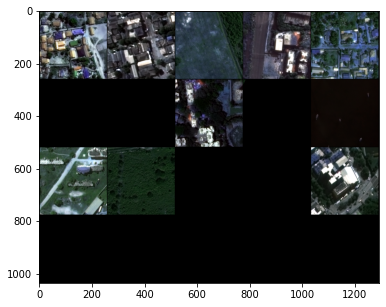

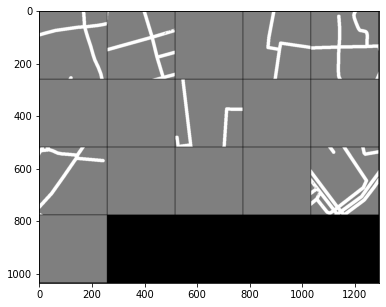

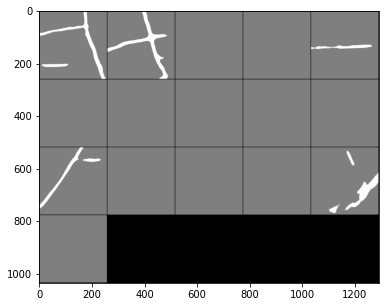

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 4: Step 7500: Generator (U-Net) loss: 8.21613076639175, p_loss: 1.3683242797851562


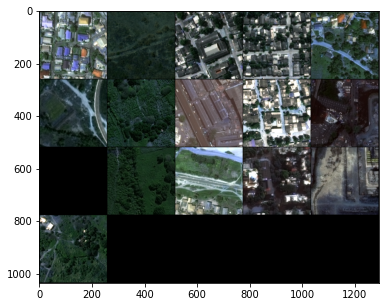

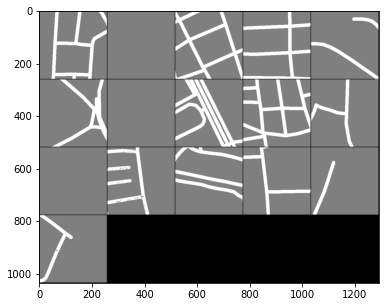

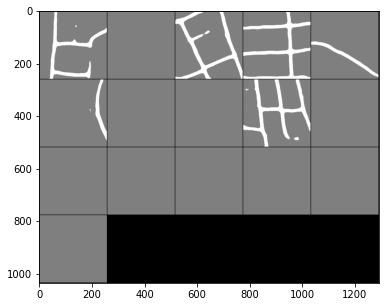

Epoch 4: Step 8000: Generator (U-Net) loss: 8.175524829626077, p_loss: 1.1051511764526367


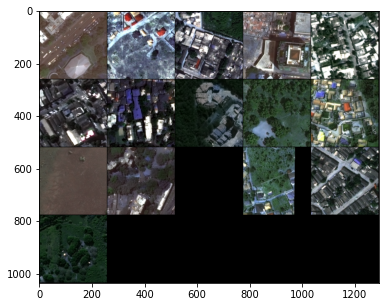

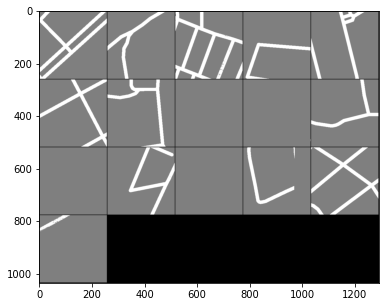

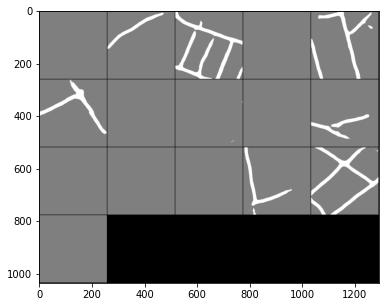

Epoch 4: Step 8500: Generator (U-Net) loss: 8.260239960670466, p_loss: 0.969626784324646


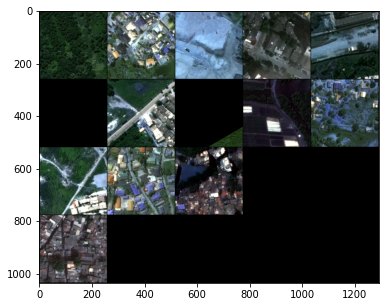

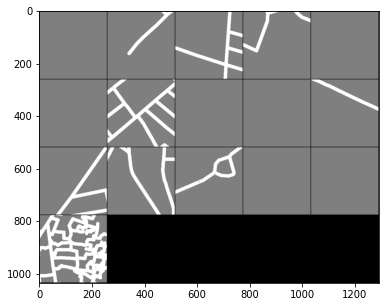

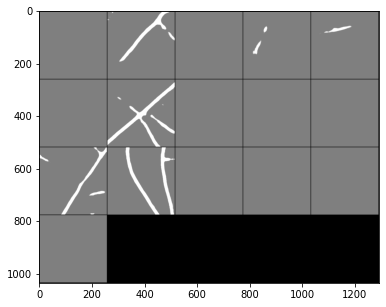

Epoch 4: Step 9000: Generator (U-Net) loss: 8.048884471893313, p_loss: 0.9752134084701538


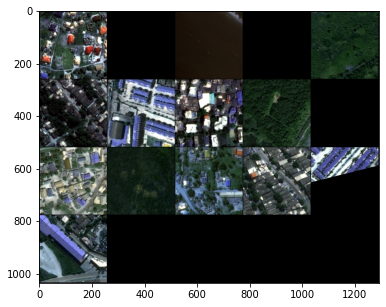

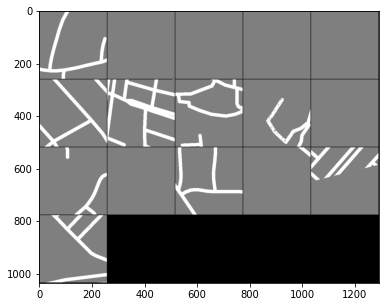

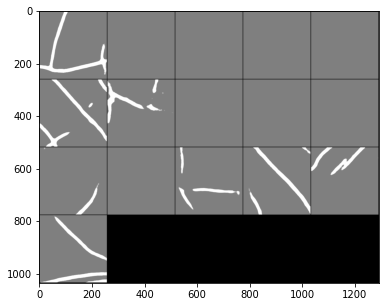

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 5: Step 9500: Generator (U-Net) loss: 8.379265646934506, p_loss: 0.9283467531204224


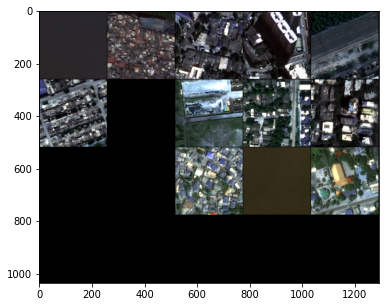

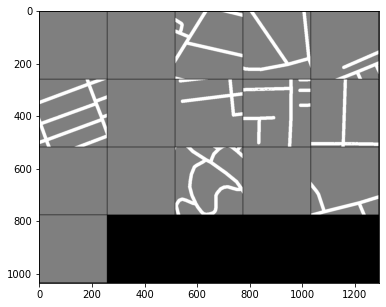

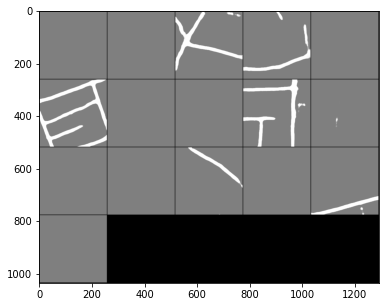

Epoch 5: Step 10000: Generator (U-Net) loss: 8.160697891235356, p_loss: 1.2290984392166138


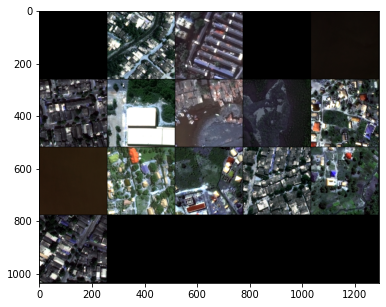

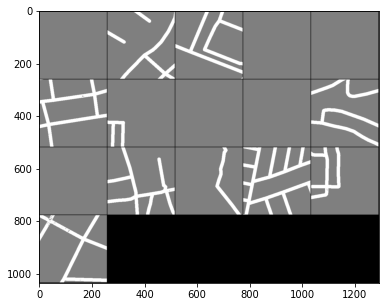

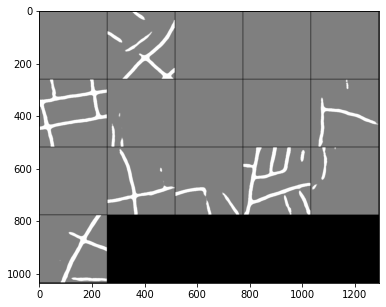

Epoch 5: Step 10500: Generator (U-Net) loss: 8.115104397773747, p_loss: 0.9041743278503418


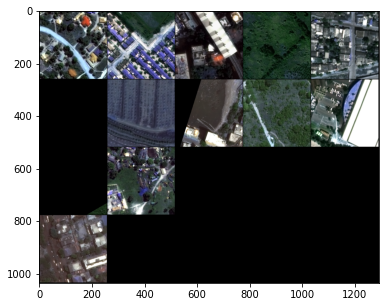

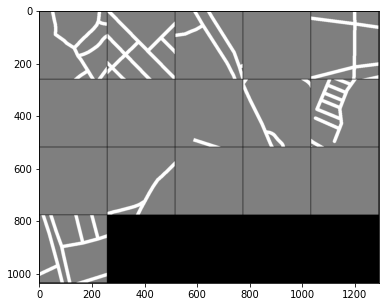

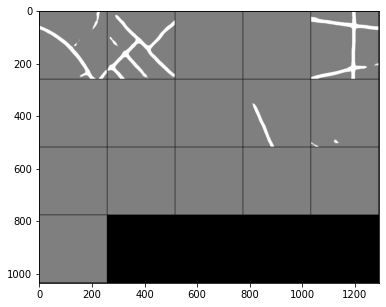

Epoch 5: Step 11000: Generator (U-Net) loss: 8.310091708660122, p_loss: 1.0610610246658325


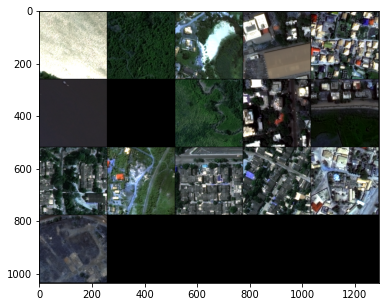

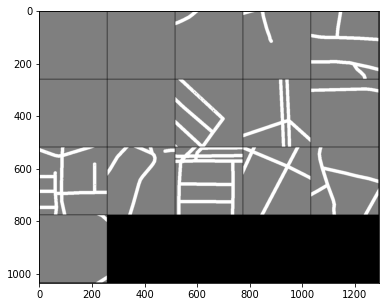

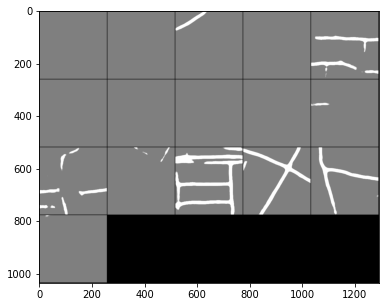

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 6: Step 11500: Generator (U-Net) loss: 8.229539938449857, p_loss: 1.0066479444503784


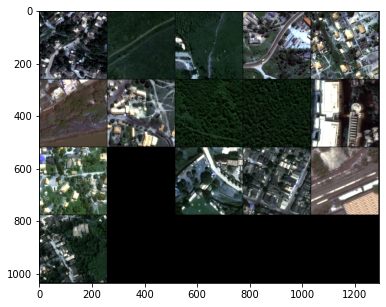

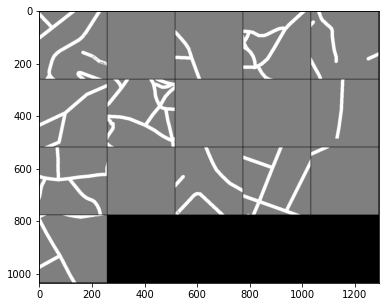

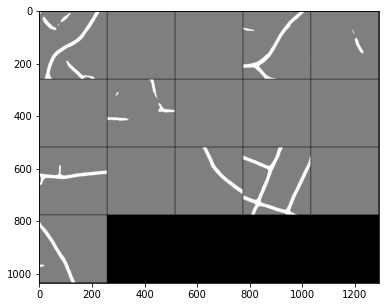

Epoch 6: Step 12000: Generator (U-Net) loss: 8.11772738742828, p_loss: 0.696822464466095


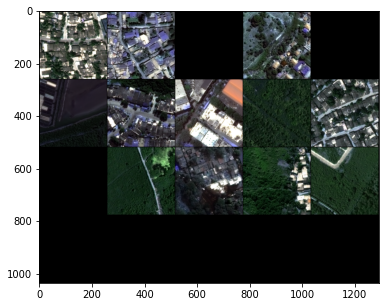

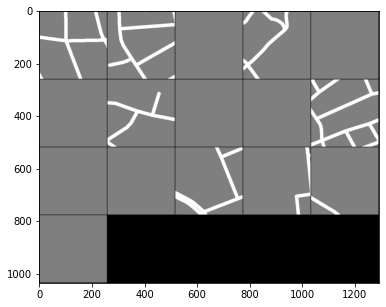

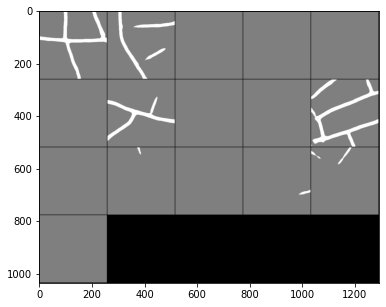

Epoch 6: Step 12500: Generator (U-Net) loss: 8.179829339981074, p_loss: 0.38448214530944824


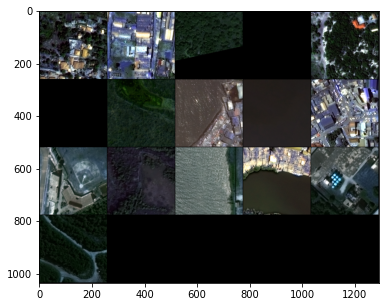

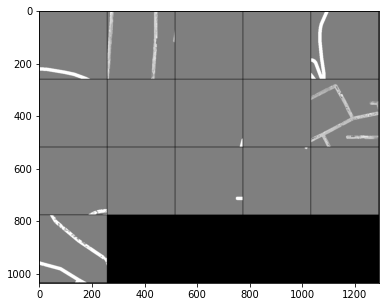

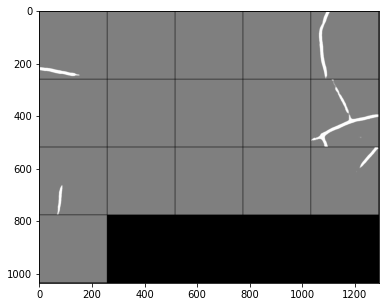

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 7: Step 13000: Generator (U-Net) loss: 8.275046625137326, p_loss: 0.8863357305526733


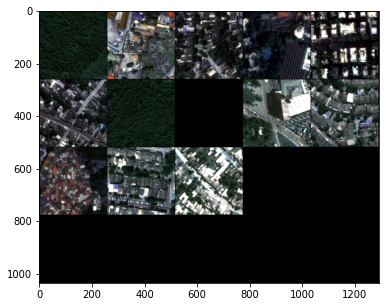

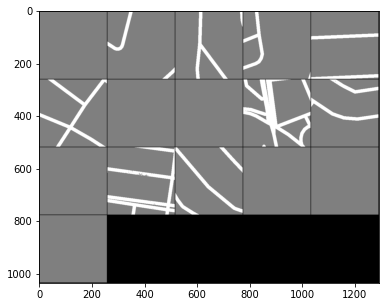

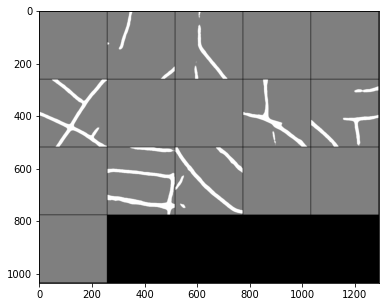

Epoch 7: Step 13500: Generator (U-Net) loss: 8.164866209983824, p_loss: 1.1561611890792847


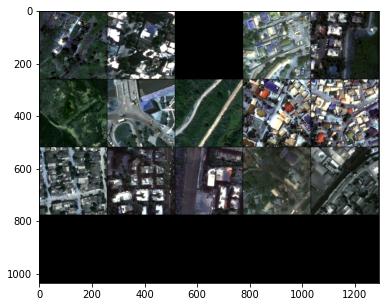

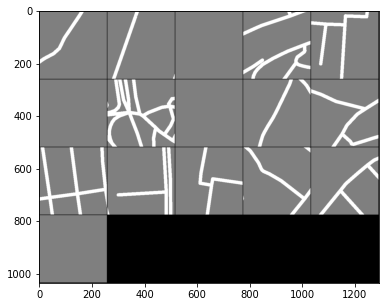

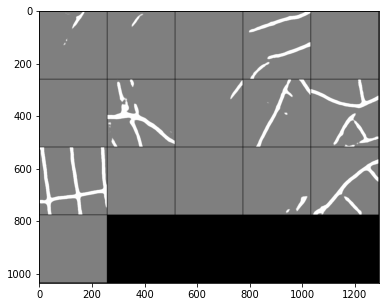

Epoch 7: Step 14000: Generator (U-Net) loss: 8.28649802589417, p_loss: 1.5202749967575073


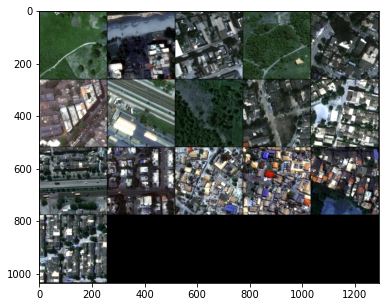

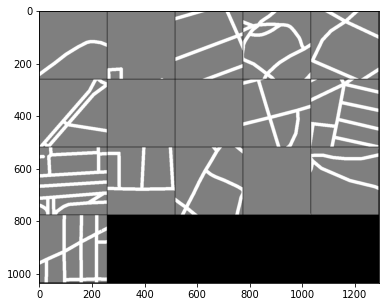

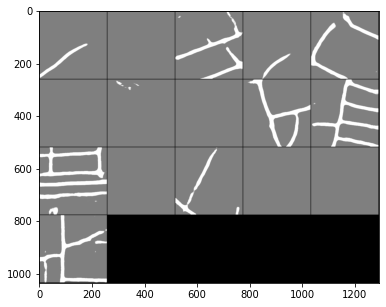

Epoch 7: Step 14500: Generator (U-Net) loss: 8.20147326564789, p_loss: 1.3593320846557617


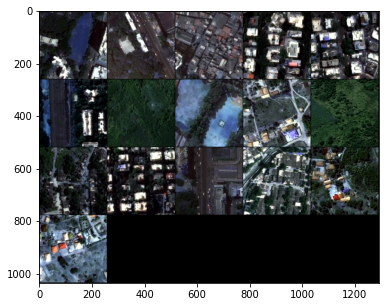

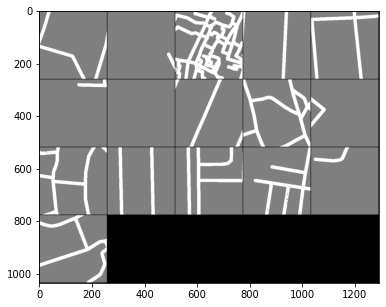

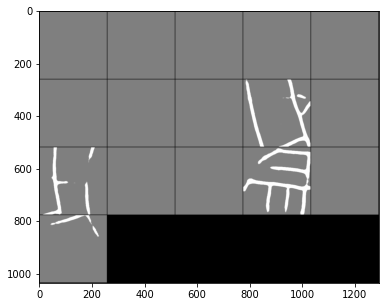

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 8: Step 15000: Generator (U-Net) loss: 8.198307428359989, p_loss: 0.9978839159011841


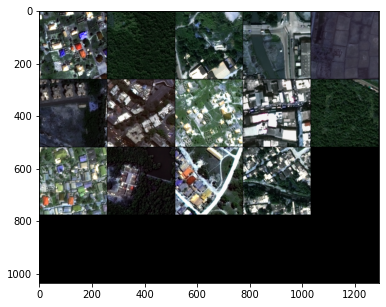

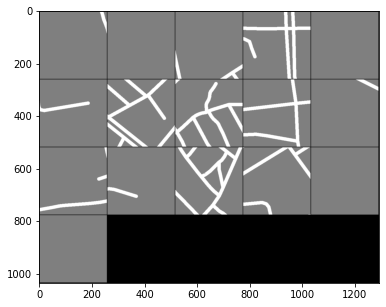

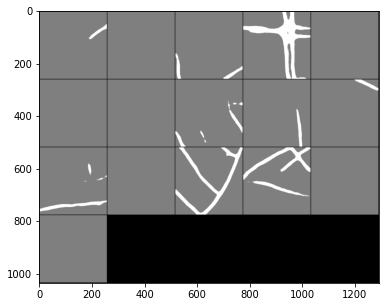

Epoch 8: Step 15500: Generator (U-Net) loss: 8.238324940204613, p_loss: 0.7276957631111145


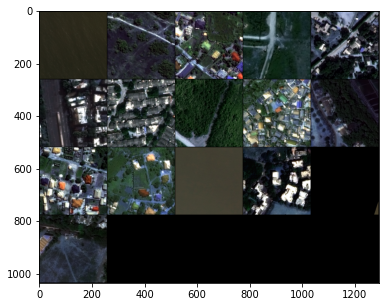

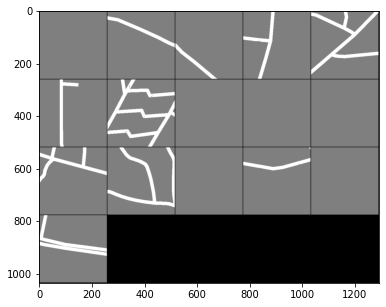

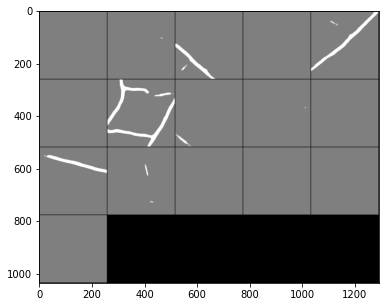

Epoch 8: Step 16000: Generator (U-Net) loss: 8.121656387805931, p_loss: 1.0546331405639648


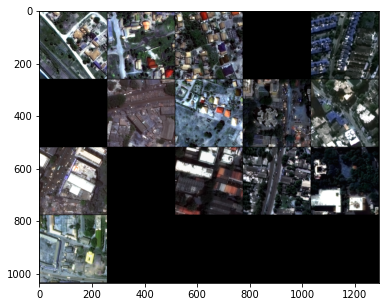

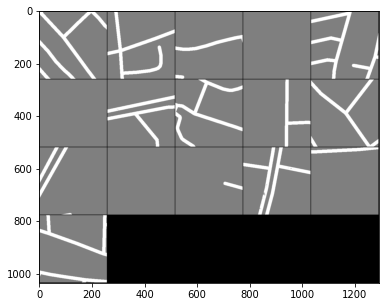

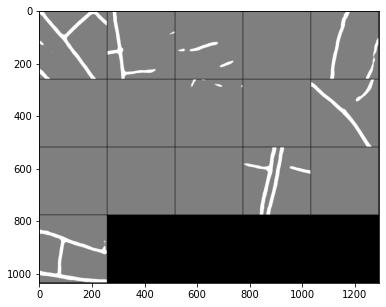

Epoch 8: Step 16500: Generator (U-Net) loss: 8.0870012717247, p_loss: 0.5390289425849915


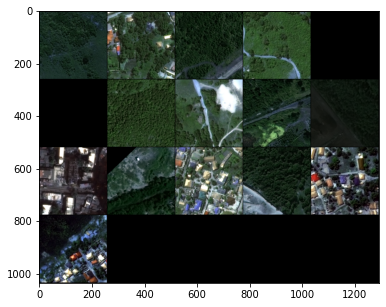

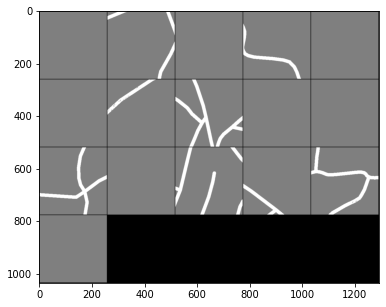

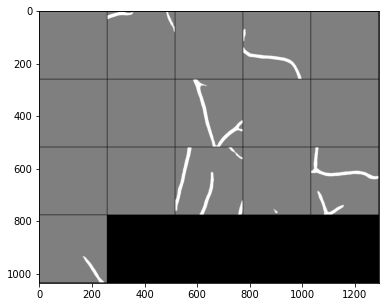

  0%|          | 0/1837 [00:00<?, ?it/s]

Epoch 9: Step 17000: Generator (U-Net) loss: 8.189484359264373, p_loss: 0.9460266828536987


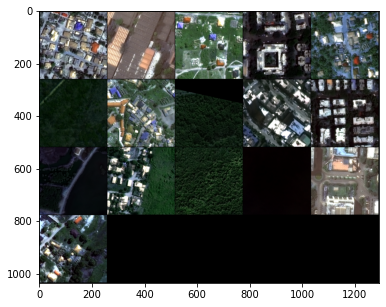

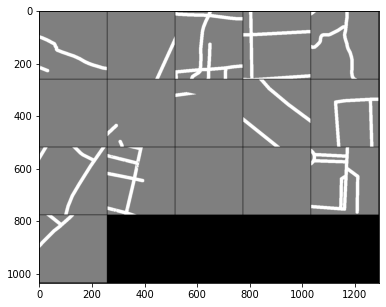

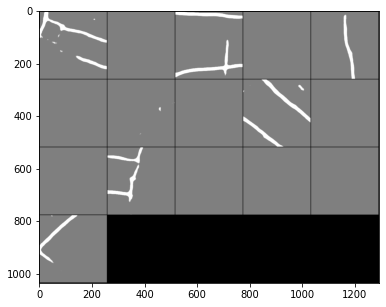

Epoch 9: Step 17500: Generator (U-Net) loss: 8.146154166221619, p_loss: 1.3048635721206665


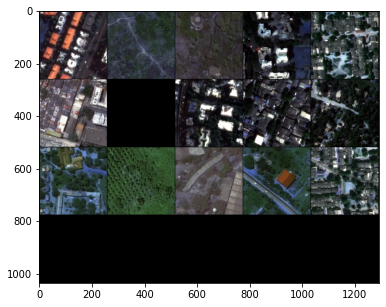

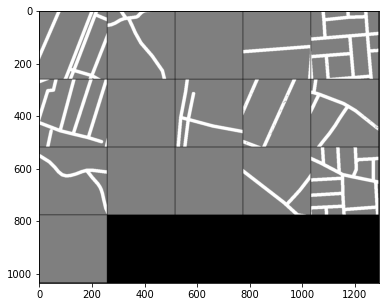

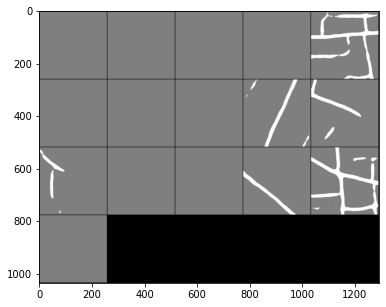

Epoch 9: Step 18000: Generator (U-Net) loss: 8.098760826110844, p_loss: 0.6459434032440186


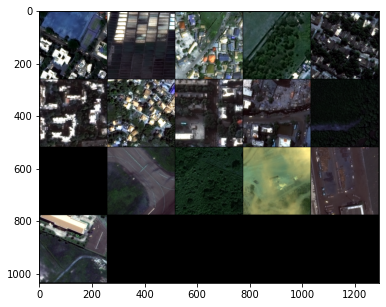

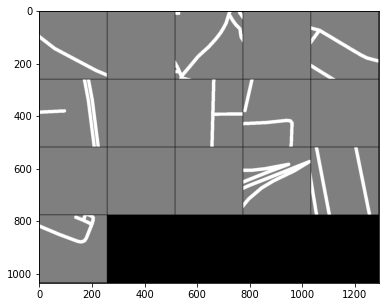

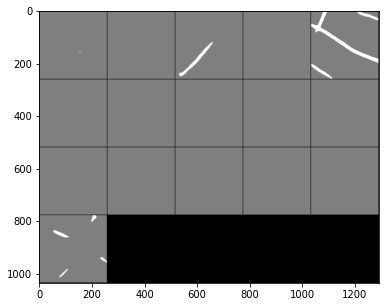

In [ ]:
train()

In [ ]:
#safety save
torch.save(gen.state_dict(), '/content/drive/MyDrive/ai4good/pix2pixperceptual.pth')

In [ ]:
def preds_to_binary(pred_arr, channel_scaling=None, bg_threshold=0):
    """Convert a set of predictions from a neural net to a binary mask.
    Arguments
    ---------
    pred_arr : :class:`numpy.ndarray`
        2D or 3D array. The predicted mask.
    channel_scaling : `list`-like of `float`s, optional
        The following operation will be performed to convert the
        multi-channel prediction to a 2D output ::
            sum(pred_arr[channel]*channel_scaling[channel])
        If not provided, no scaling will be performend and channels will be
        summed.
    bg_threshold : `int` or `float`, optional
        The cutoff to set to distinguish between background and foreground
        pixels in the final binary mask. Binarization takes place *after*
        channel scaling and summation (if applicable). Defaults to 0.
    Returns
    -------
    mask_arr : :class:`numpy.ndarray`
        A 2D boolean ``numpy`` array with ``True`` for foreground pixels and
        ``False`` for background.
    """
    pred_arr = _check_skimage_im_load(pred_arr).copy()

    if len(pred_arr.shape) == 3:
      #if channels are in the first dimension reshape
        if pred_arr.shape[0] < pred_arr.shape[-1]:
            pred_arr = pred_arr.transpose(1,2,0)
        # if scale values weren't provided, nothing to do
        if channel_scaling is not None:  
            pred_arr = np.sum(pred_arr*np.array(channel_scaling), axis=-1)

    mask_arr = (pred_arr > bg_threshold).astype('uint8')

    return mask_arr*255

In [ ]:
def mask_to_poly_geojson(pred_arr, 
                         channel_scaling=None,
                         reference_im=None,
                         output_path=None,
                         output_type='geojson',
                         min_area=40,
                         bg_threshold=0,
                         do_transform=None,
                         simplify=False,
                         tolerance=0.5,
                         **kwargs):
    """Get polygons from an image mask.
    Arguments
    ---------
    pred_arr : :class:`numpy.ndarray`
        A 2D array of integers. Multi-channel masks are not supported, and must
        be simplified before passing to this function. Can also pass an image
        file path here.
    channel_scaling : :class:`list`-like, optional
        If `pred_arr` is a 3D array, this argument defines how each channel
        will be combined to generate a binary output. channel_scaling should
        be a `list`-like of length equal to the number of channels in
        `pred_arr`. The following operation will be performed to convert the
        multi-channel prediction to a 2D output ::
            sum(pred_arr[channel]*channel_scaling[channel])
        If not provided, no scaling will be performend and channels will be
        summed.
    reference_im : str, optional
        The path to a reference geotiff to use for georeferencing the polygons
        in the mask. Required if saving to a GeoJSON (see the ``output_type``
        argument), otherwise only required if ``do_transform=True``.
    output_path : str, optional
        Path to save the output file to. If not provided, no file is saved.
    output_type : ``'csv'`` or ``'geojson'``, optional
        If ``output_path`` is provided, this argument defines what type of file
        will be generated - a CSV (``output_type='csv'``) or a geojson
        (``output_type='geojson'``).
    min_area : int, optional
        The minimum area of a polygon to retain. Filtering is done AFTER
        any coordinate transformation, and therefore will be in destination
        units.
    bg_threshold : int, optional
        The cutoff in ``mask_arr`` that denotes background (non-object).
        Defaults to ``0``.
    simplify : bool, optional
        If ``True``, will use the Douglas-Peucker algorithm to simplify edges,
        saving memory and processing time later. Defaults to ``False``.
    tolerance : float, optional
        The tolerance value to use for simplification with the Douglas-Peucker
        algorithm. Defaults to ``0.5``. Only has an effect if
        ``simplify=True``.
    Returns
    -------
    gdf : :class:`geopandas.GeoDataFrame`
        A GeoDataFrame of polygons.
    """

    mask_arr = preds_to_binary(pred_arr, channel_scaling, bg_threshold)

    if do_transform and reference_im is None:
        raise ValueError(
            'Coordinate transformation requires a reference image.')

    if do_transform:
        with rasterio.open(reference_im) as ref:
            transform = ref.transform
            crs = ref.crs
            ref.close()
    else:
        transform = Affine(1, 0, 0, 0, 1, 0)  # identity transform
        crs = rasterio.crs.CRS()

    mask = mask_arr > bg_threshold
    mask = mask.astype('uint8')

    polygon_generator = features.shapes(mask_arr,
                                        transform=transform,
                                        mask=mask)
    polygons = []
    values = []  # pixel values for the polygon in mask_arr
    for polygon, value in polygon_generator:
        p = shape(polygon).buffer(0.0)
        if p.area >= min_area:
            polygons.append(shape(polygon).buffer(0.0))
            values.append(value)

    polygon_gdf = gpd.GeoDataFrame({'geometry': polygons, 'value': values},
                                   crs=crs.to_wkt())
    if simplify:
        polygon_gdf['geometry'] = polygon_gdf['geometry'].apply(
            lambda x: x.simplify(tolerance=tolerance)
        )
    # save output files
    if output_path is not None:
        if output_type.lower() == 'geojson':
            if len(polygon_gdf) > 0:
                polygon_gdf.to_file(output_path, driver='GeoJSON')
            else:
                save_empty_geojson(output_path, polygon_gdf.crs.to_epsg())
        elif output_type.lower() == 'csv':
            polygon_gdf.to_csv(output_path, index=False)

    return polygon_gdf